# Getting price for reference items

I'm done entering all my receipts. Each expense is matched with a product, which is matched with a reference item. The reference item is the non-gluten-free product that we calculate the price difference with. 

Things we'll need for each reference item:
- Price
- Weight
- URL
- Screenshot (as proof)
- Time stamp of scrape

After the initial attempt to search and save scraping: 
- Walmart.ca is difficult to scrape, I'll try another website
- Instead of the reference item name, I'll add actual product names to simplify search

Todo db changes: 
- Need a table for scrapes with url, info, timestamp
- Reference item: keep name, but remove info, link to latest product scrape

In [172]:
%pip install -q pandas

Note: you may need to restart the kernel to use updated packages.


In [173]:
import pandas as pd

## Load list of product names

In [206]:
df_mapping = pd.read_csv('reference_products_mapping.csv')
df_mapping.head(20)

,id,name,product_name
0,1,BBQ Sauce,Kraft BBQ Sauce
1,2,Beans,Heinz Baked Beans
2,3,Bouillon cubes,Knorr Chicken Bouillon
3,4,Candy,Maynards Swedish Berries
4,5,Cereal,Kellogg's Corn Flakes
5,6,Chia seeds,Bulk Chia Seeds
6,7,Chips,Lay's Classic Chips
7,8,Chocolate,Hershey's Milk Chocolate Bar
8,9,Chocolate chips,Hershey's Semi-Sweet Chocolate Chips
9,10,Cookies,Oreo Cookies


## Get the goods

In [175]:
%pip install -q \
    requests \
    bs4 \
    fake_useragent

Note: you may need to restart the kernel to use updated packages.


### First: find product (cheapest), get product page URL (screenshot)

In [202]:
# cleaner version

import json
from typing import Dict
import requests
from bs4 import BeautifulSoup
from datetime import datetime, timezone
import random

# https://www.foodbasics.ca/search?sortOrder=price-asc&filter={query}
# https://www.walmart.ca/en/search?q={query}&sort=price_low

def scrape_search(query):
    domain="https://www.foodbasics.ca"
    website=domain+"/search?sortOrder=price-asc&filter={query}"
    def get_random_headers():
        user_agents = [
            'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3', 
            'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_10_1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/39.0.2171.95 Safari/537.36',
            'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36',
            'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/14.0.3 Safari/605.1.15'
        ]
        return {'User-Agent': random.choice(user_agents)}
    # hdr = {'User-Agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_10_1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/39.0.2171.95 Safari/537.36'}
    hdr = get_random_headers()

    hdr = get_random_headers()
    query = query.replace(" ", "+")
    url = website.format(query=query)

    response = requests.get(url, headers=hdr)
    response_text = response.text

    # with open('response_test.txt', 'w') as file:
    #     file.write(response.text)
    # with open('response_test.txt', 'r') as file:
    #     response_text = file.read()

    soup = BeautifulSoup(response_text, 'html.parser')

    items = []
    for product in soup.find_all('div', class_='default-product-tile'):
        title = product.find('div', class_='head__title').text.strip()
        unit_details = product.find('span', class_='head__unit-details').text.strip()
        sale_price = product.find('div', class_='content__pricing').find('div', attrs={'data-main-price': True})['data-main-price']
        # product.find('span', class_='price-update').text.strip()
        secondary_price = product.find('div', class_='pricing__secondary-price').text.strip()
        product_url = product.find('a', class_='product-details-link')['href']
        clean_item = clean_up_item({
            'title': title,
            'weight': unit_details,
            'price': sale_price,
            'price_per_unit': secondary_price,
            'url': domain+product_url
        })
        items.append(clean_item)

    # for item in items:
    #     print(item)

    return items

def get_cheapest(items):
    print(f"Getting cheapest of len(items) item(s):")
    sorted_items = sorted([item for item in items if item['pricePerWeight'] is not None], key=lambda x: x['pricePerWeight'])
    cheapest = sorted_items[0]
    print(cheapest)
    return cheapest

def clean_up_item(scraped_item: Dict) -> Dict:
    def get_clean_price(price: str) -> float:
        price = float(scraped_item['price'].replace('$', ''))
        return price
    price = get_clean_price(scraped_item['price'])

    def get_clean_quantity(weight: str) -> float:
        if 'x' in weight:
            parts = weight.split('x')
            multiplier = float(parts[0].strip())
            unit = float(parts[1].split()[0])
            quantity = multiplier * unit
            return quantity
        else:
            return float(scraped_item['weight'].split()[0])
    quantity = get_clean_quantity(scraped_item['weight'])

    def calculate_price_per_weight(quantity: float, price: float) -> float:
        return price / quantity

    return {
        'name': scraped_item['title'],
        'quantity': quantity,
        'unitOfMeasure': scraped_item['weight'].split()[1],
        'price': price,
        'pricePerWeight': calculate_price_per_weight(quantity, price),
        'referenceUrl': scraped_item['url'],
        'createdAt': datetime.now(timezone.utc).isoformat(timespec='milliseconds').replace('+00:00', 'Z')
    }

In [177]:
# scrape_search("Kraft BBQ Sauce")
# print("cheapest out of available:")
# print(get_cheapest(scrape_search("Kraft BBQ Sauce")))

### Get the screenshot

In [178]:
%pip install -q selenium webdriver-manager IPython

Note: you may need to restart the kernel to use updated packages.


In [209]:
#  test
# https://www.foodbasics.ca/search?sortOrder=price-asc&filter=kraft+dinner

from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from webdriver_manager.chrome import ChromeDriverManager
import os
from IPython.display import Image, display

def test_view_url(url):
    # Set up Chrome options
    chrome_options = Options()
    chrome_options.add_argument("--headless")
    chrome_options.add_argument("--window-size=1280x900")
    # chrome_options.add_argument(f"user-agent={hdr['User-Agent']}")
    chrome_options.add_argument(f"user-agent='Mozilla/5.0 (Macintosh; Intel Mac OS X 10_10_1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/39.0.2171.95 Safari/537.36'")

    # Initialize the Chrome driver
    driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=chrome_options)

    # Open the URL
    driver.get(url)

    # Remove the div with id "onetrust-consent-sdk"
    try:
        consent_div = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.ID, "onetrust-consent-sdk"))
        )
        driver.execute_script("""
            var element = arguments[0];
            element.parentNode.removeChild(element);
        """, consent_div)
    except Exception as e:
        print(f"Could not find or remove the consent div: {e}")

    # Create the screenshots directory if it doesn't exist
    if not os.path.exists('./screenshots'):
        os.makedirs('./screenshots')

    screenshot = driver.get_screenshot_as_png()
    display(Image(data=screenshot, width=500))
    # Quit the driver
    driver.quit()

# test_view_url("https://www.foodbasics.ca/search?sortOrder=price-asc&filter=kraft+dinner")

In [179]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from webdriver_manager.chrome import ChromeDriverManager
import os
from IPython.display import Image, display

def save_screencapture(url, product_name_query):
    # Set up Chrome options
    chrome_options = Options()
    chrome_options.add_argument("--headless")
    chrome_options.add_argument("--window-size=1280x900")
    # chrome_options.add_argument(f"user-agent={hdr['User-Agent']}")
    chrome_options.add_argument(f"user-agent='Mozilla/5.0 (Macintosh; Intel Mac OS X 10_10_1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/39.0.2171.95 Safari/537.36'")

    # Initialize the Chrome driver
    driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=chrome_options)

    # Open the URL
    driver.get(url)

    # Remove the div with id "onetrust-consent-sdk"
    try:
        consent_div = WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.ID, "onetrust-consent-sdk"))
        )
        driver.execute_script("""
            var element = arguments[0];
            element.parentNode.removeChild(element);
        """, consent_div)
    except Exception as e:
        print(f"Could not find or remove the consent div: {e}")

    # Create the screenshots directory if it doesn't exist
    if not os.path.exists('./screenshots'):
        os.makedirs('./screenshots')

    # # Perform a mouse click in the middle of the view
    # webdriver.ActionChains(driver).move_by_offset(750, 500).click().perform()

    # # Set the window size to 1500x2000
    # driver.set_window_size(1500, 2000)
    # Save the screenshot
    timestamp = pd.Timestamp.now().strftime('%Y-%m-%d_%H-%M-%S')
    save_path = f"./screenshots/{product_name_query}_{timestamp}.png"
    driver.save_screenshot(save_path)

    # Quit the driver
    driver.quit()

    return save_path

In [180]:
# save_screencapture( get_cheapest(scrape_search("Kraft BBQ Sauce"))['url'] , f'./screenshots/random_product.png')

# # Display the screenshot
# display(Image(filename='./screenshots/random_product.png', width=500))

## Connceting in bulk

TODO
- [x] Store scraped data (list of products in search results)
- [x] Store target product details
- [x] Add target product scrape data to db (or somewhere for report generation for now)

In [181]:
# place to dump scrapes, just in case need to re-run, keeping it simple
# in an app, nosql would be a good choice because scrapes might have different attributes
def dump_scrape(items):
    # note: added timestamp directly into items
    with open(f'./scrapes_dump.json', 'a') as file:
        for item in items:
            json.dump(item, file, indent=4)
            file.write(",\n")
    print(f'Saved {len(items)} item(s)')

In [182]:
import sqlite3

def save_item(item, screenshot_filename):
    item['screenshot'] = screenshot_filename
    # add to sqlite
    conn = sqlite3.connect('db_test.db')
    c = conn.cursor()

    c.execute('''
        CREATE TABLE IF NOT EXISTS product_price_proof (
            id INTEGER PRIMARY KEY AUTOINCREMENT,
            name TEXT,
            quantity TEXT,
            unitOfMeasure TEXT,
            price REAL,
            pricePerWeight REAL,
            referenceUrl TEXT,
            screenshot TEXT,
            createdAt TEXT,
            reference_item_id INT
        )
    ''')

    c.execute('''
        INSERT INTO product_price_proof (name, quantity, unitOfMeasure, price, pricePerWeight, referenceUrl, screenshot, createdAt, reference_item_id)
        VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?)
    ''', (item['name'], item['quantity'], item['unitOfMeasure'], item['price'], item['pricePerWeight'], item['referenceUrl'], item['screenshot'], item['createdAt'], item['reference_item_id']))

    conn.commit()
    conn.close()
    print(f"Saved item {item}")


Initiate search for Hershey's Semi-Sweet Chocolate Chips
Saved 5 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Semi-Sweet Chocolate Chips', 'quantity': '925', 'unitOfMeasure': 'g', 'price': 9.99, 'pricePerWeight': 0.0108, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/baking-ingredients/chocolate-cocoa/semi-sweet-chocolate-chips/p/059749997096', 'createdAt': '2025-01-27T02:59:52.402Z', 'reference_item_id': 9}
Saved item {'name': 'Semi-Sweet Chocolate Chips', 'quantity': '925', 'unitOfMeasure': 'g', 'price': 9.99, 'pricePerWeight': 0.0108, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/baking-ingredients/chocolate-cocoa/semi-sweet-chocolate-chips/p/059749997096', 'createdAt': '2025-01-27T02:59:52.402Z', 'reference_item_id': 9, 'screenshot': "./screenshots/Hershey's Semi-Sweet Chocolate Chips_2025-01-26_21-59-54.png"}


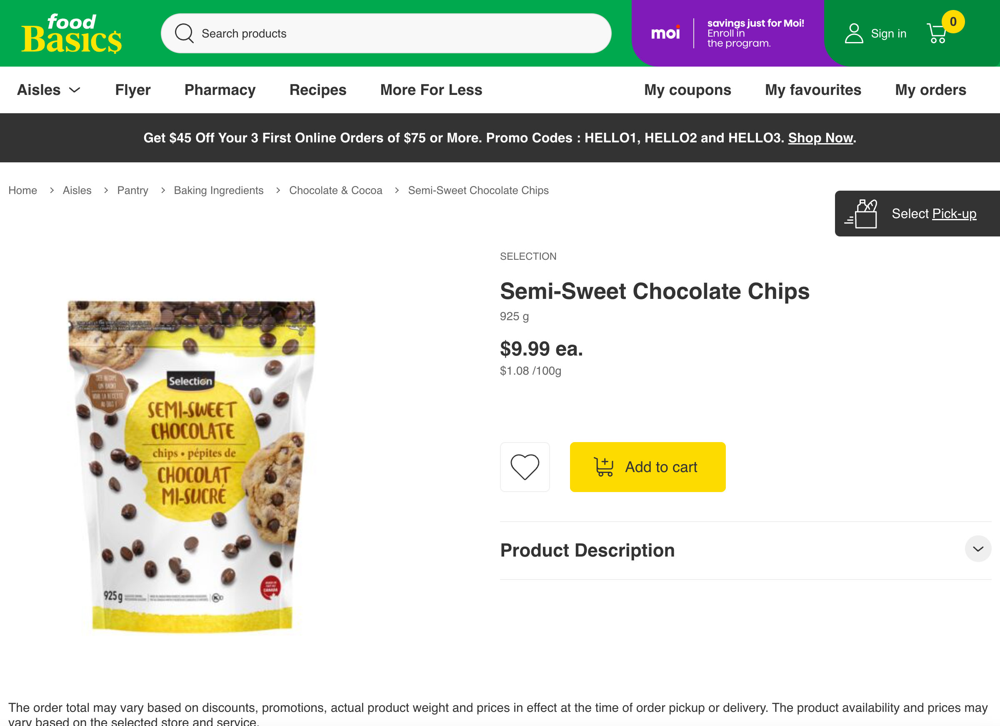

In [ ]:
auto_search(product_name_query=df_mapping.iloc[8]['product_name'], reference_item_id=df_mapping.iloc[8]['id'])

In [186]:
import pandas as pd

# Connect to the SQLite database
conn = sqlite3.connect('db_test.db')
c = conn.cursor()

# Execute a query to select all rows from the product_price_proof table
c.execute('SELECT * FROM product_price_proof')

# Fetch all rows from the executed query
rows = c.fetchall()

# Print the column names
column_names = [description[0] for description in c.description]

# Create a DataFrame from the fetched rows
df = pd.DataFrame(rows, columns=column_names)

# Close the connection
conn.close()

# Display the DataFrame
df

,id,name,quantity,unitOfMeasure,price,pricePerWeight,referenceUrl,screenshot,createdAt,reference_item_id
0,1,Semi-Sweet Chocolate Chips,925,g,9.99,0.0108,https://www.foodbasics.ca/aisles/pantry/baking...,./screenshots/Hershey's Semi-Sweet Chocolate C...,2025-01-27T02:59:52.402Z,9


#### Data management thoughts

- I don't want to polute the main db with endless scrapes of all items, I don't really need all the items; it's just a safety net for analysis right now to not have to scrape everything all over again
- I don't mind however having the list of products to grow long, because in the ideal case this would have a daily price update, so that the diff in the price is close to the compartor on the same date. There are about 100 reference items, so it would be about 35k entries per year, it's manageable. I can archive/condense the data as years go by. 
- I don't think this structure is ideal, but I don't want to spend time right now fixing it (e.g. screenshots would be better store as key to another table, timestamps standardized, ...)

TODO
- [x] Add reference_item ID to scrape (both target item and dump)
- [x] clean up data (prices, weight, etc), match app data structure
- [x] Generate list log of products that didn't yield results to easily query them later

### Run a batch

In [187]:
# import os

# def CLEANSTATE():
#     # Delete the database file if it exists
#     if os.path.exists('db_test.db'):
#         os.remove('db_test.db')
#         print("Deleted db_test.db")

#     # Delete the scrapes dump file if it exists
#     if os.path.exists('scrapes_dump.json'):
#         os.remove('scrapes_dump.json')
#         print("Deleted scrapes_dump.json")

# # DESTRUCTIVE
# CLEANSTATE()

Deleted db_test.db
Deleted scrapes_dump.json


Initiate search for Kraft BBQ Sauce
Saved 3 item(s)
Getting cheapest of len(items) item(s):
{'name': "Chicken 'N Rib BBQ Sauce", 'quantity': '455', 'unitOfMeasure': 'mL', 'price': 3.29, 'pricePerWeight': 0.007230769230769231, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/condiments-toppings/bbq-marinade-sauces/chicken-n-rib-bbq-sauce/p/068100078589', 'createdAt': '2025-01-27T03:04:36.799Z', 'reference_item_id': 1}
Saved item {'name': "Chicken 'N Rib BBQ Sauce", 'quantity': '455', 'unitOfMeasure': 'mL', 'price': 3.29, 'pricePerWeight': 0.007230769230769231, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/condiments-toppings/bbq-marinade-sauces/chicken-n-rib-bbq-sauce/p/068100078589', 'createdAt': '2025-01-27T03:04:36.799Z', 'reference_item_id': 1, 'screenshot': './screenshots/Kraft BBQ Sauce_2025-01-26_22-04-39.png'}


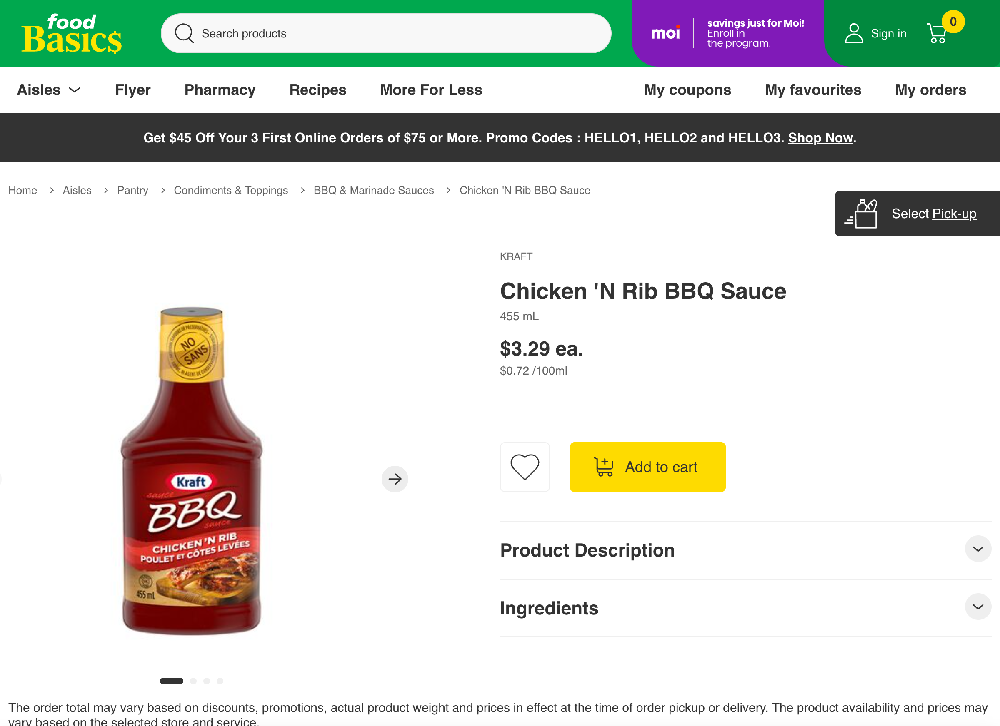

Initiate search for Heinz Baked Beans
Search query for Heinz Baked Beans did not return any results
Initiate search for Knorr Chicken Bouillon
Saved 4 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Halal Chicken Flavoured Bouillon Cubes', 'quantity': '80', 'unitOfMeasure': 'g', 'price': 1.29, 'pricePerWeight': 0.016125, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/herbs-spices-sauces/stock-gravy/halal-chicken-flavoured-bouillon-cubes/p/068400804895', 'createdAt': '2025-01-27T03:04:40.077Z', 'reference_item_id': 3}
Saved item {'name': 'Halal Chicken Flavoured Bouillon Cubes', 'quantity': '80', 'unitOfMeasure': 'g', 'price': 1.29, 'pricePerWeight': 0.016125, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/herbs-spices-sauces/stock-gravy/halal-chicken-flavoured-bouillon-cubes/p/068400804895', 'createdAt': '2025-01-27T03:04:40.077Z', 'reference_item_id': 3, 'screenshot': './screenshots/Knorr Chicken Bouillon_2025-01-26_22-04-42.png'}


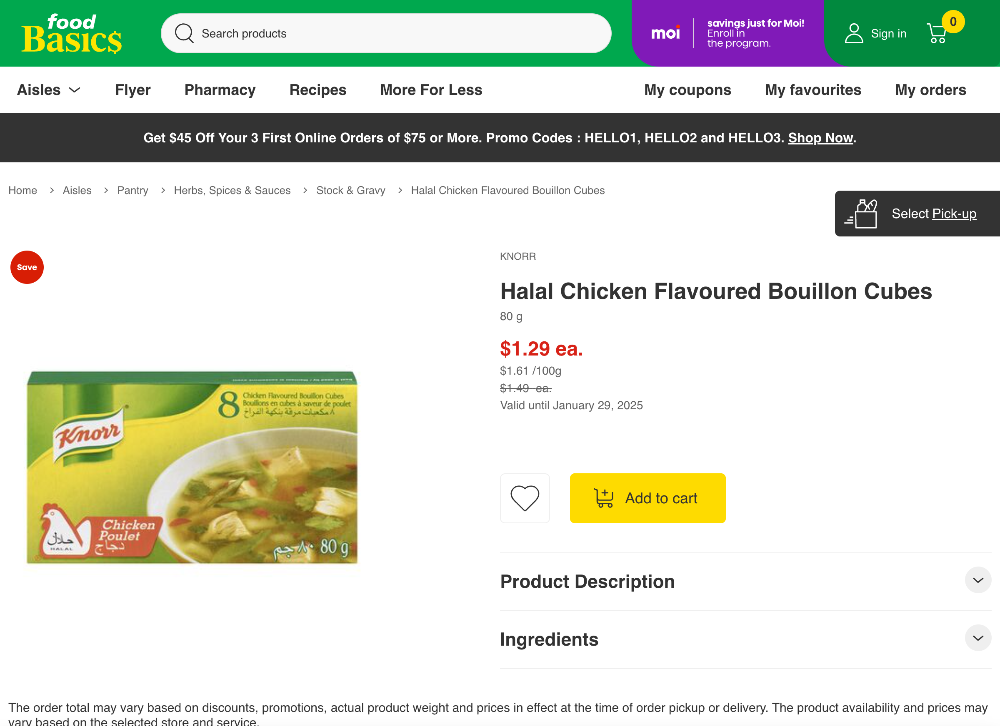

Initiate search for Maynards Swedish Berries
Saved 4 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Gummy Berries, Swedish Berries', 'quantity': '315', 'unitOfMeasure': 'g', 'price': 3.99, 'pricePerWeight': 0.012666666666666668, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/sweet-snacks-candy/candy-gum/gummy-berries/p/057700018095', 'createdAt': '2025-01-27T03:04:43.059Z', 'reference_item_id': 4}
Saved item {'name': 'Gummy Berries, Swedish Berries', 'quantity': '315', 'unitOfMeasure': 'g', 'price': 3.99, 'pricePerWeight': 0.012666666666666668, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/sweet-snacks-candy/candy-gum/gummy-berries/p/057700018095', 'createdAt': '2025-01-27T03:04:43.059Z', 'reference_item_id': 4, 'screenshot': './screenshots/Maynards Swedish Berries_2025-01-26_22-04-45.png'}


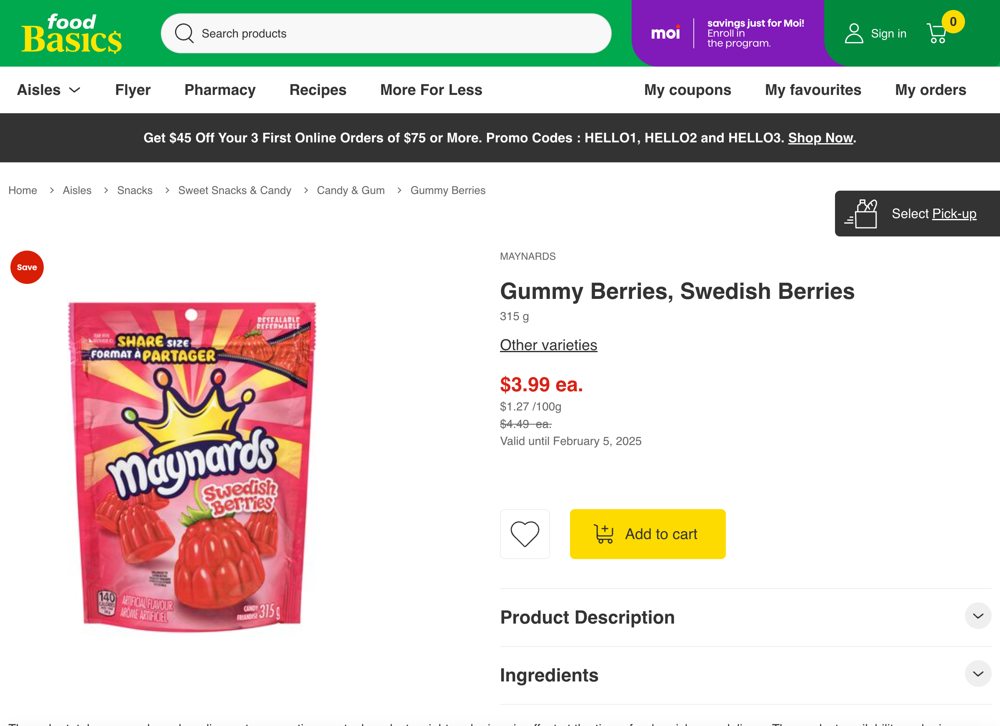

Initiate search for Kellogg's Corn Flakes
Search query for Kellogg's Corn Flakes did not return any results
Initiate search for Bulk Chia Seeds
Search query for Bulk Chia Seeds did not return any results
Initiate search for Lay's Classic Chips
Saved 5 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Classic Flavour Chips, Party Size', 'quantity': '415', 'unitOfMeasure': 'g', 'price': 4.99, 'pricePerWeight': 0.012024096385542169, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/salty-snacks/chips/classic-flavour-chips/p/060410047002', 'createdAt': '2025-01-27T03:04:46.990Z', 'reference_item_id': 7}
Saved item {'name': 'Classic Flavour Chips, Party Size', 'quantity': '415', 'unitOfMeasure': 'g', 'price': 4.99, 'pricePerWeight': 0.012024096385542169, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/salty-snacks/chips/classic-flavour-chips/p/060410047002', 'createdAt': '2025-01-27T03:04:46.990Z', 'reference_item_id': 7, 'screenshot': "./screenshots/Lay's Classic Ch

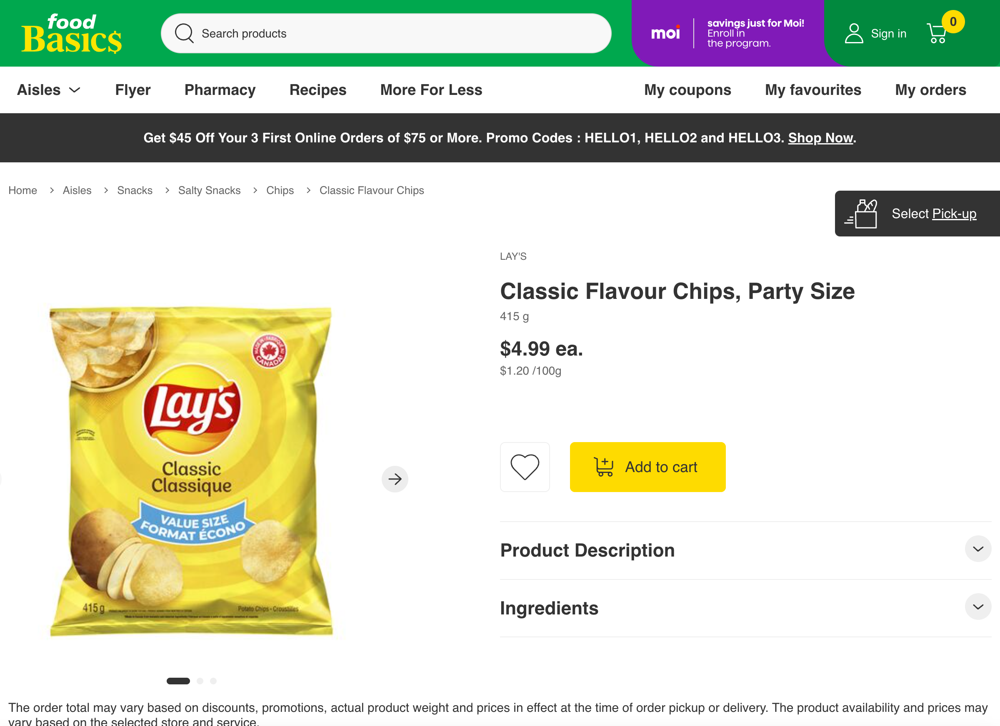

Initiate search for Hershey's Milk Chocolate Bar


ValueError: could not convert string to float: '2\xa0/'

In [188]:
# Run the list
for index, row in df_mapping.iterrows():
    auto_search(product_name_query=row['product_name'], reference_item_id=row['id'])

Initiate search for Hershey's Milk Chocolate Bar
Saved 30 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Chewy Caramel and Nut Granola Bars Coated With Milk ...', 'quantity': '172', 'unitOfMeasure': 'g', 'price': 1.99, 'pricePerWeight': 0.011569767441860465, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/sweet-snacks-candy/chewy-bars-fruit-snacks/chewy-caramel-and-nut-granola-bars-coated-with-milk-chocolate/p/059749950695', 'createdAt': '2025-01-27T03:21:26.220Z', 'reference_item_id': 8}
Saved item {'name': 'Chewy Caramel and Nut Granola Bars Coated With Milk ...', 'quantity': '172', 'unitOfMeasure': 'g', 'price': 1.99, 'pricePerWeight': 0.011569767441860465, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/sweet-snacks-candy/chewy-bars-fruit-snacks/chewy-caramel-and-nut-granola-bars-coated-with-milk-chocolate/p/059749950695', 'createdAt': '2025-01-27T03:21:26.220Z', 'reference_item_id': 8, 'screenshot': "./screenshots/Hershey's Milk Chocolate Bar_2025-01-2

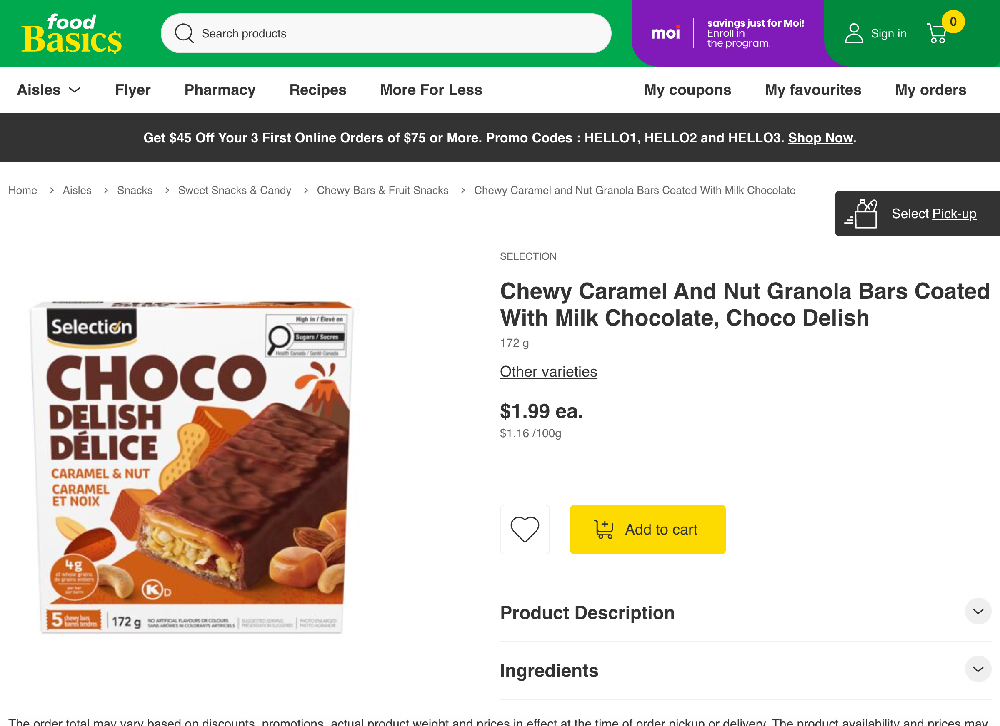

Initiate search for Hershey's Semi-Sweet Chocolate Chips
Saved 5 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Semi-Sweet Chocolate Chips', 'quantity': '925', 'unitOfMeasure': 'g', 'price': 9.99, 'pricePerWeight': 0.0108, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/baking-ingredients/chocolate-cocoa/semi-sweet-chocolate-chips/p/059749997096', 'createdAt': '2025-01-27T03:21:29.714Z', 'reference_item_id': 9}
Saved item {'name': 'Semi-Sweet Chocolate Chips', 'quantity': '925', 'unitOfMeasure': 'g', 'price': 9.99, 'pricePerWeight': 0.0108, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/baking-ingredients/chocolate-cocoa/semi-sweet-chocolate-chips/p/059749997096', 'createdAt': '2025-01-27T03:21:29.714Z', 'reference_item_id': 9, 'screenshot': "./screenshots/Hershey's Semi-Sweet Chocolate Chips_2025-01-26_22-21-31.png"}


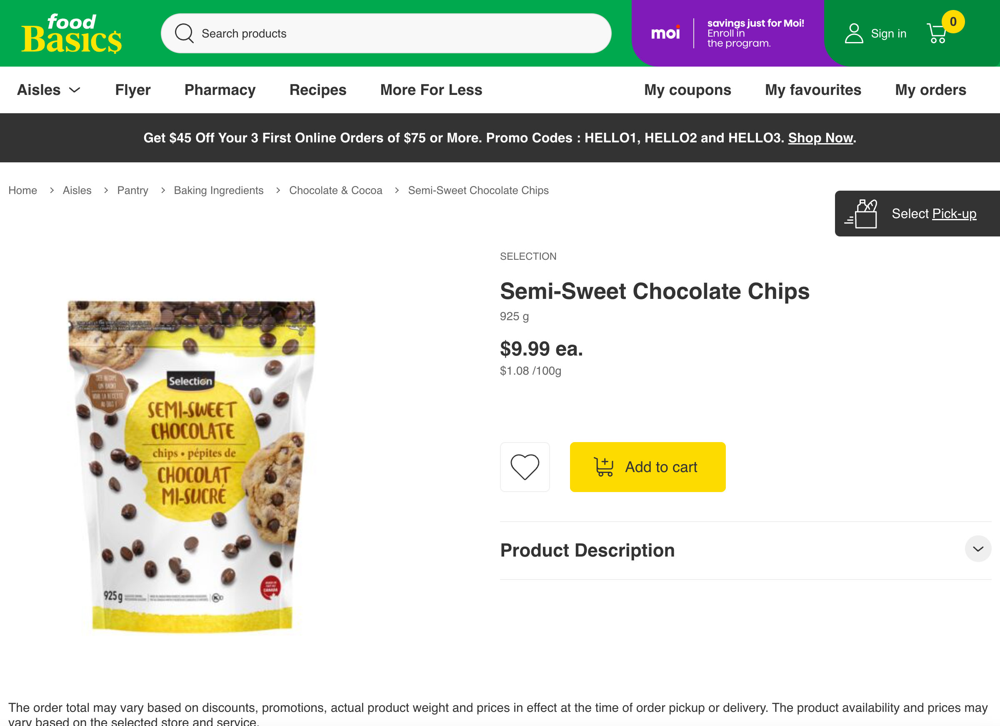

Initiate search for Oreo Cookies


ValueError: could not convert string to float: '6x222'

In [191]:
# Run the rest
for index, row in df_mapping.iloc[7:].iterrows():
    auto_search(product_name_query=row['product_name'], reference_item_id=row['id'])

Index: 9
Initiate search for Oreo Cookies
Saved 24 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Oreo Cookie Cola Flavoured Soft Drink, Zero Sugar', 'quantity': 1332.0, 'unitOfMeasure': 'mL', 'price': 3.99, 'pricePerWeight': 0.0029954954954954957, 'referenceUrl': 'https://www.foodbasics.ca/aisles/beverages/soft-drinks/cola/oreo-cookie-cola-flavoured-soft-drink/p/067000013362', 'createdAt': '2025-01-27T03:31:16.507Z', 'reference_item_id': 10}
Saved item {'name': 'Oreo Cookie Cola Flavoured Soft Drink, Zero Sugar', 'quantity': 1332.0, 'unitOfMeasure': 'mL', 'price': 3.99, 'pricePerWeight': 0.0029954954954954957, 'referenceUrl': 'https://www.foodbasics.ca/aisles/beverages/soft-drinks/cola/oreo-cookie-cola-flavoured-soft-drink/p/067000013362', 'createdAt': '2025-01-27T03:31:16.507Z', 'reference_item_id': 10, 'screenshot': './screenshots/Oreo Cookies_2025-01-26_22-31-19.png'}


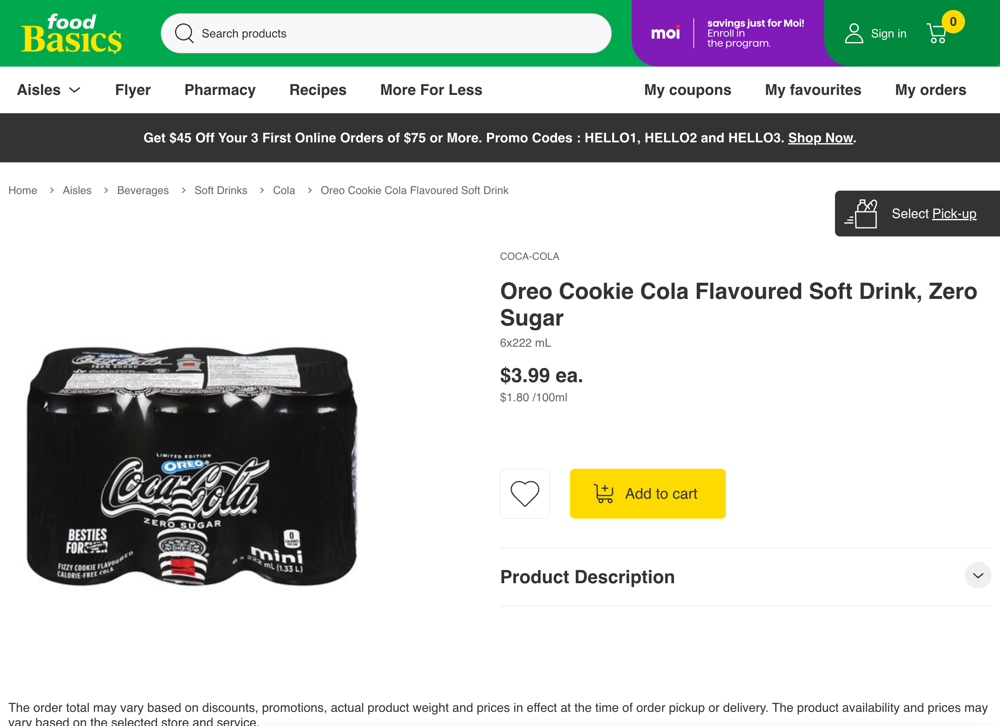

Index: 10
Initiate search for Kingsford's Cornstarch
Search query for Kingsford's Cornstarch did not return any results
Index: 11
Initiate search for Ritz Crackers
Saved 21 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Snowflake Shaped Crackers, Ritz', 'quantity': 180.0, 'unitOfMeasure': 'g', 'price': 0.62, 'pricePerWeight': 0.0034444444444444444, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/salty-snacks/crackers/snowflake-shaped-crackers/p/066721028372', 'createdAt': '2025-01-27T03:31:20.506Z', 'reference_item_id': 12}
Saved item {'name': 'Snowflake Shaped Crackers, Ritz', 'quantity': 180.0, 'unitOfMeasure': 'g', 'price': 0.62, 'pricePerWeight': 0.0034444444444444444, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/salty-snacks/crackers/snowflake-shaped-crackers/p/066721028372', 'createdAt': '2025-01-27T03:31:20.506Z', 'reference_item_id': 12, 'screenshot': './screenshots/Ritz Crackers_2025-01-26_22-31-23.png'}


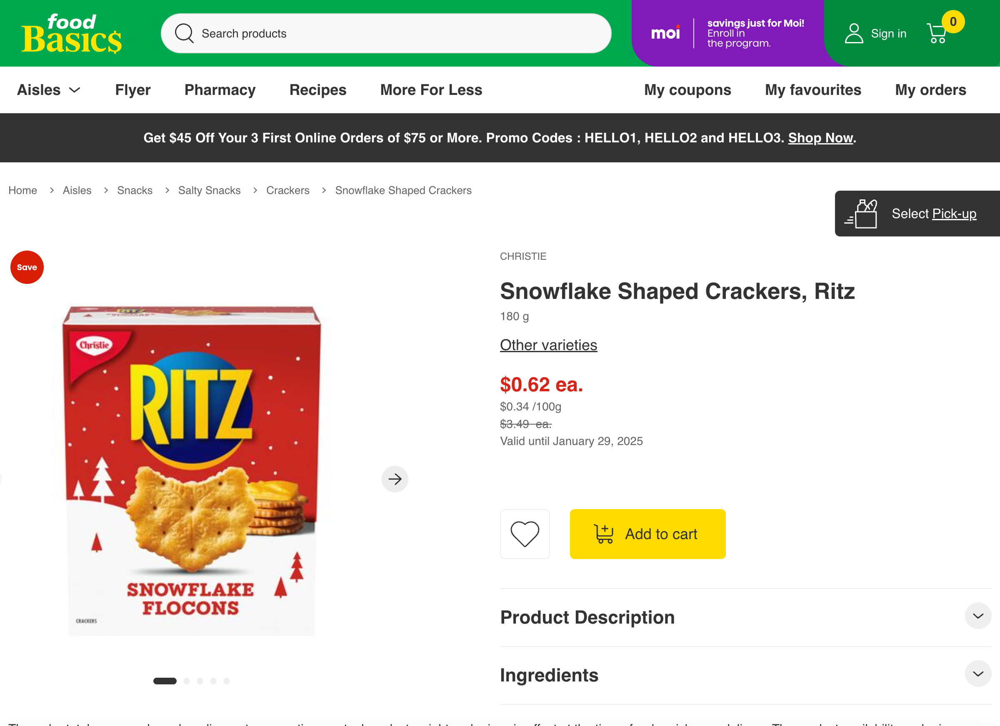

Index: 12
Initiate search for Robin Hood All-Purpose Flour
Saved 8 item(s)
Getting cheapest of len(items) item(s):
{'name': 'All Purpose Gluten-Free Flour Blend', 'quantity': 907.0, 'unitOfMeasure': 'g', 'price': 8.49, 'pricePerWeight': 0.00936052921719956, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/baking-ingredients/flour-baking-essentials/all-purpose-gluten-free-flour-blend/p/059000700007', 'createdAt': '2025-01-27T03:31:23.842Z', 'reference_item_id': 13}
Saved item {'name': 'All Purpose Gluten-Free Flour Blend', 'quantity': 907.0, 'unitOfMeasure': 'g', 'price': 8.49, 'pricePerWeight': 0.00936052921719956, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/baking-ingredients/flour-baking-essentials/all-purpose-gluten-free-flour-blend/p/059000700007', 'createdAt': '2025-01-27T03:31:23.842Z', 'reference_item_id': 13, 'screenshot': './screenshots/Robin Hood All-Purpose Flour_2025-01-26_22-31-26.png'}


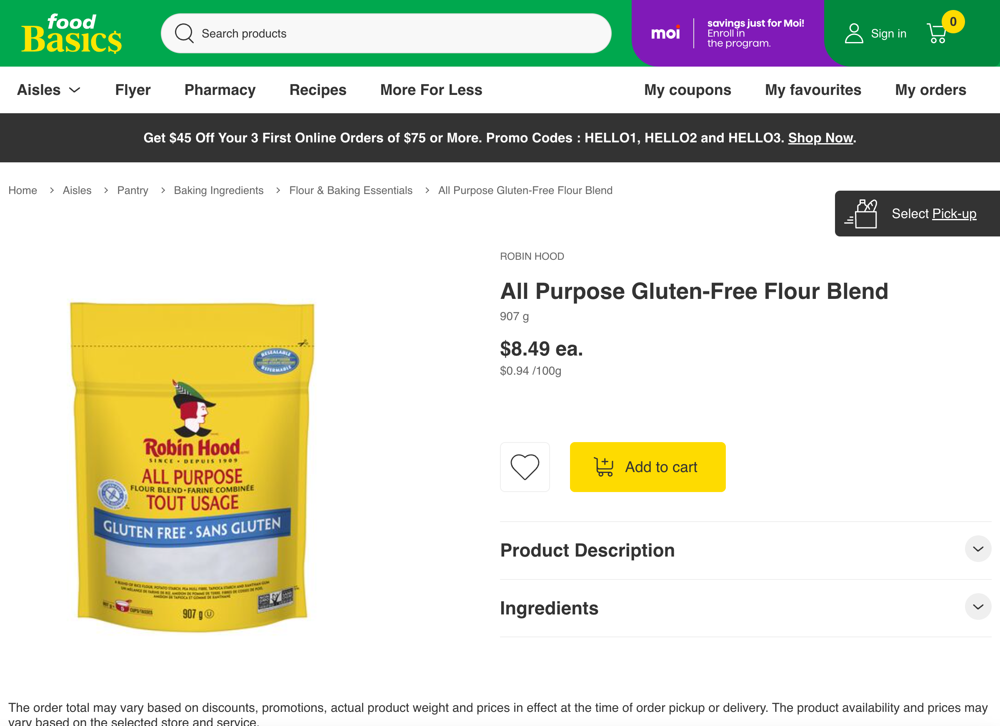

Index: 13
Initiate search for Nature Valley Granola
Saved 24 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Peanut Butter Coated Peanut Chewy Granola Bars Value...', 'quantity': 980.0, 'unitOfMeasure': 'g', 'price': 12.49, 'pricePerWeight': 0.012744897959183673, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/sweet-snacks-candy/chewy-bars-fruit-snacks/peanut-butter-coated-peanut-chewy-granola-bars-value-pack/p/065633185944', 'createdAt': '2025-01-27T03:31:27.124Z', 'reference_item_id': 14}
Saved item {'name': 'Peanut Butter Coated Peanut Chewy Granola Bars Value...', 'quantity': 980.0, 'unitOfMeasure': 'g', 'price': 12.49, 'pricePerWeight': 0.012744897959183673, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/sweet-snacks-candy/chewy-bars-fruit-snacks/peanut-butter-coated-peanut-chewy-granola-bars-value-pack/p/065633185944', 'createdAt': '2025-01-27T03:31:27.124Z', 'reference_item_id': 14, 'screenshot': './screenshots/Nature Valley Granola_2025-01-26_22-31-

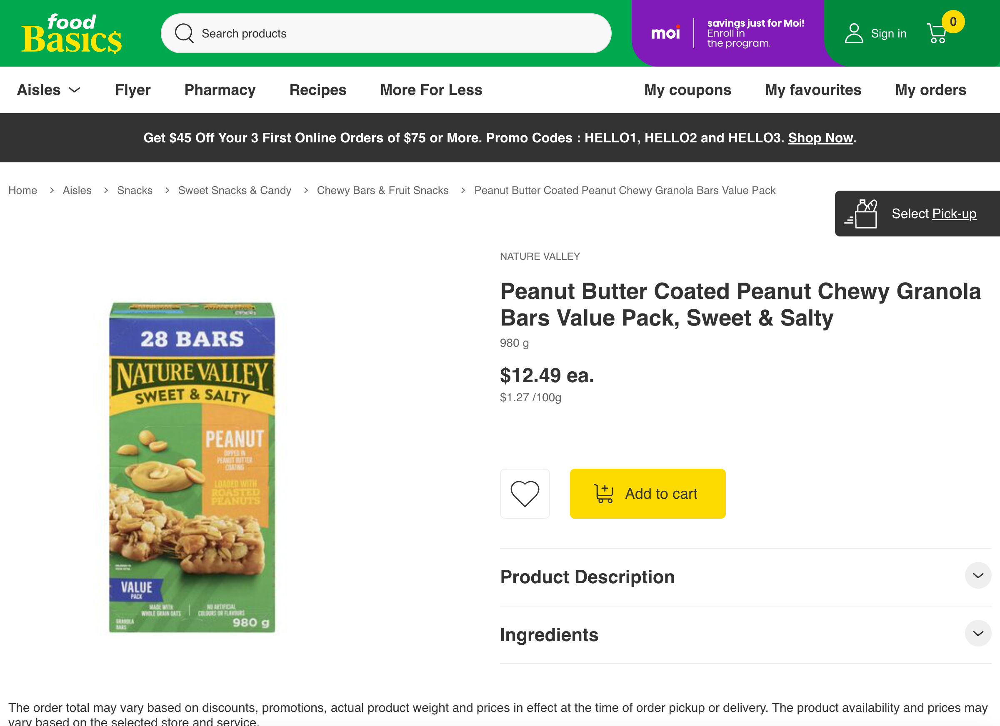

Index: 14
Initiate search for Nature Valley Granola Bars
Saved 27 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Peanut Butter Coated Peanut Chewy Granola Bars Value...', 'quantity': 980.0, 'unitOfMeasure': 'g', 'price': 12.49, 'pricePerWeight': 0.012744897959183673, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/sweet-snacks-candy/chewy-bars-fruit-snacks/peanut-butter-coated-peanut-chewy-granola-bars-value-pack/p/065633185944', 'createdAt': '2025-01-27T03:31:30.673Z', 'reference_item_id': 15}
Saved item {'name': 'Peanut Butter Coated Peanut Chewy Granola Bars Value...', 'quantity': 980.0, 'unitOfMeasure': 'g', 'price': 12.49, 'pricePerWeight': 0.012744897959183673, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/sweet-snacks-candy/chewy-bars-fruit-snacks/peanut-butter-coated-peanut-chewy-granola-bars-value-pack/p/065633185944', 'createdAt': '2025-01-27T03:31:30.673Z', 'reference_item_id': 15, 'screenshot': './screenshots/Nature Valley Granola Bars_2025-01

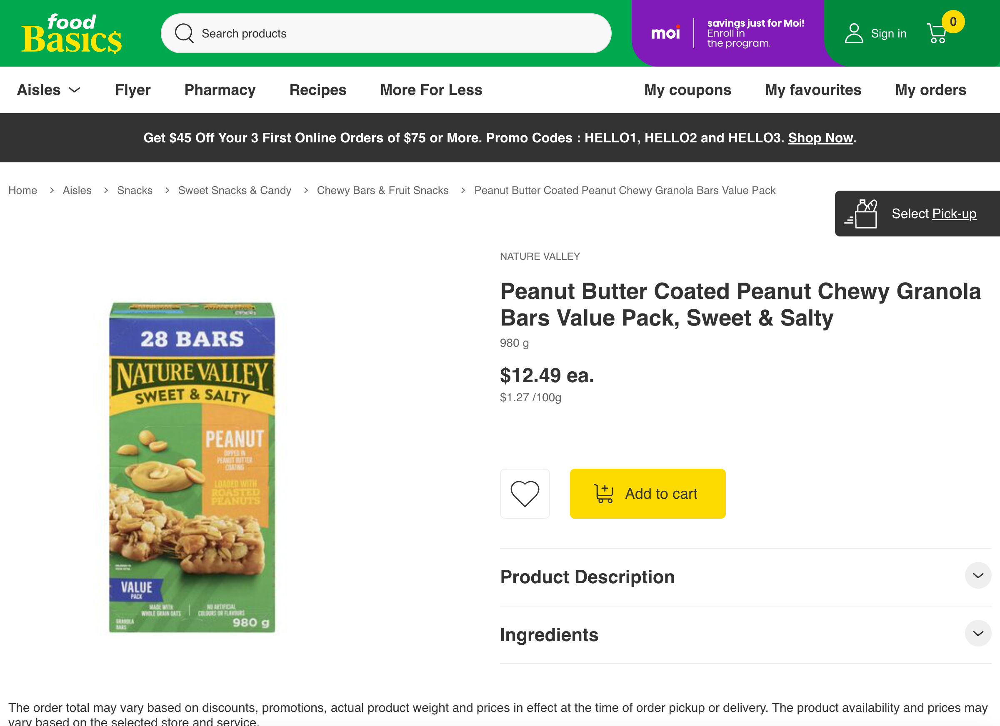

Index: 15
Initiate search for Excel Gum
Saved 22 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Iced Mint Flavoured Sugar-Free Gum', 'quantity': 54.0, 'unitOfMeasure': 'un', 'price': 3.79, 'pricePerWeight': 0.07018518518518518, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/sweet-snacks-candy/candy-gum/iced-mint-flavoured-sugar-free-gum/p/058496462543', 'createdAt': '2025-01-27T03:31:34.016Z', 'reference_item_id': 16}
Saved item {'name': 'Iced Mint Flavoured Sugar-Free Gum', 'quantity': 54.0, 'unitOfMeasure': 'un', 'price': 3.79, 'pricePerWeight': 0.07018518518518518, 'referenceUrl': 'https://www.foodbasics.ca/aisles/snacks/sweet-snacks-candy/candy-gum/iced-mint-flavoured-sugar-free-gum/p/058496462543', 'createdAt': '2025-01-27T03:31:34.016Z', 'reference_item_id': 16, 'screenshot': './screenshots/Excel Gum_2025-01-26_22-31-36.png'}


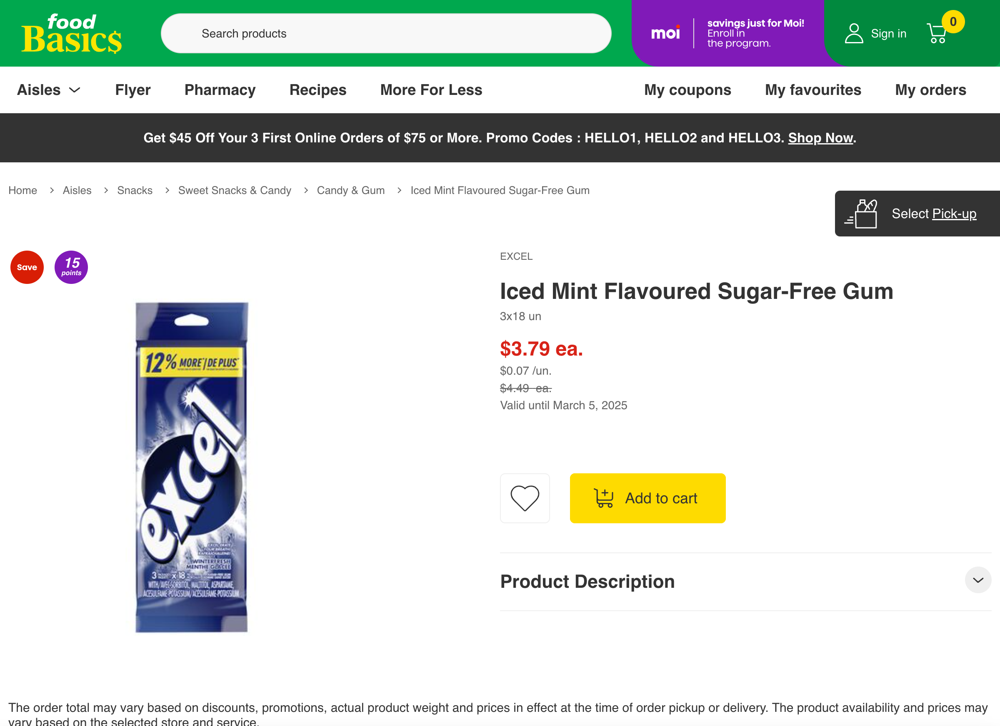

Index: 16
Initiate search for Nestle Rich Chocolate Mix
Search query for Nestle Rich Chocolate Mix did not return any results
Index: 17
Initiate search for Smucker's Strawberry Jam
Search query for Smucker's Strawberry Jam did not return any results
Index: 18
Initiate search for Kraft Dinner
Search query for Kraft Dinner did not return any results
Index: 19
Initiate search for Neilson 2% Milk
Search query for Neilson 2% Milk did not return any results
Index: 20
Initiate search for Generic Product
Search query for Generic Product did not return any results
Index: 21
Initiate search for Mr. Noodles Instant Noodles
Search query for Mr. Noodles Instant Noodles did not return any results
Index: 22
Initiate search for Quaker Oats
Search query for Quaker Oats did not return any results
Index: 23
Initiate search for Catelli Pasta
Search query for Catelli Pasta did not return any results
Index: 24
Initiate search for Classico Tomato Basil
Search query for Classico Tomato Basil did not return an

In [199]:
# Run the rest
for index, row in df_mapping.iloc[9:].iterrows():
    print(f"Index: {index}")
    auto_search(product_name_query=row['product_name'], reference_item_id=row['id'])

Index: 16
Initiate search for Nestle Rich Chocolate Mix
Saved 12 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Chocolate Syrup', 'quantity': 700.0, 'unitOfMeasure': 'mL', 'price': 6.29, 'pricePerWeight': 0.008985714285714286, 'referenceUrl': 'https://www.foodbasics.ca/aisles/beverages/drink-mixes/liquid-drink-mixes/chocolate-syrup/p/055000031318', 'createdAt': '2025-01-27T03:32:49.216Z', 'reference_item_id': 17}
Saved item {'name': 'Chocolate Syrup', 'quantity': 700.0, 'unitOfMeasure': 'mL', 'price': 6.29, 'pricePerWeight': 0.008985714285714286, 'referenceUrl': 'https://www.foodbasics.ca/aisles/beverages/drink-mixes/liquid-drink-mixes/chocolate-syrup/p/055000031318', 'createdAt': '2025-01-27T03:32:49.216Z', 'reference_item_id': 17, 'screenshot': './screenshots/Nestle Rich Chocolate Mix_2025-01-26_22-32-51.png'}


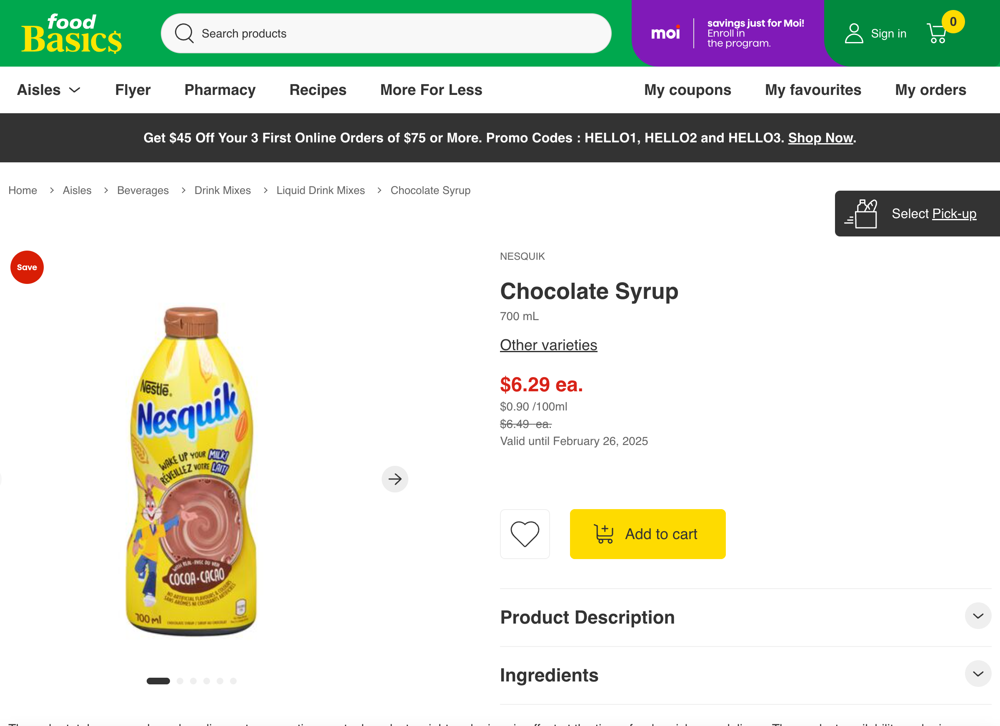

Index: 17
Initiate search for Smucker's Strawberry Jam
Saved 4 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Strawberry Jam, Pure', 'quantity': 500.0, 'unitOfMeasure': 'mL', 'price': 5.99, 'pricePerWeight': 0.011980000000000001, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/cereals-spreads-syrups/jams-jellies/strawberry-jam/p/051500025925', 'createdAt': '2025-01-27T03:32:52.020Z', 'reference_item_id': 18}
Saved item {'name': 'Strawberry Jam, Pure', 'quantity': 500.0, 'unitOfMeasure': 'mL', 'price': 5.99, 'pricePerWeight': 0.011980000000000001, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/cereals-spreads-syrups/jams-jellies/strawberry-jam/p/051500025925', 'createdAt': '2025-01-27T03:32:52.020Z', 'reference_item_id': 18, 'screenshot': "./screenshots/Smucker's Strawberry Jam_2025-01-26_22-32-54.png"}


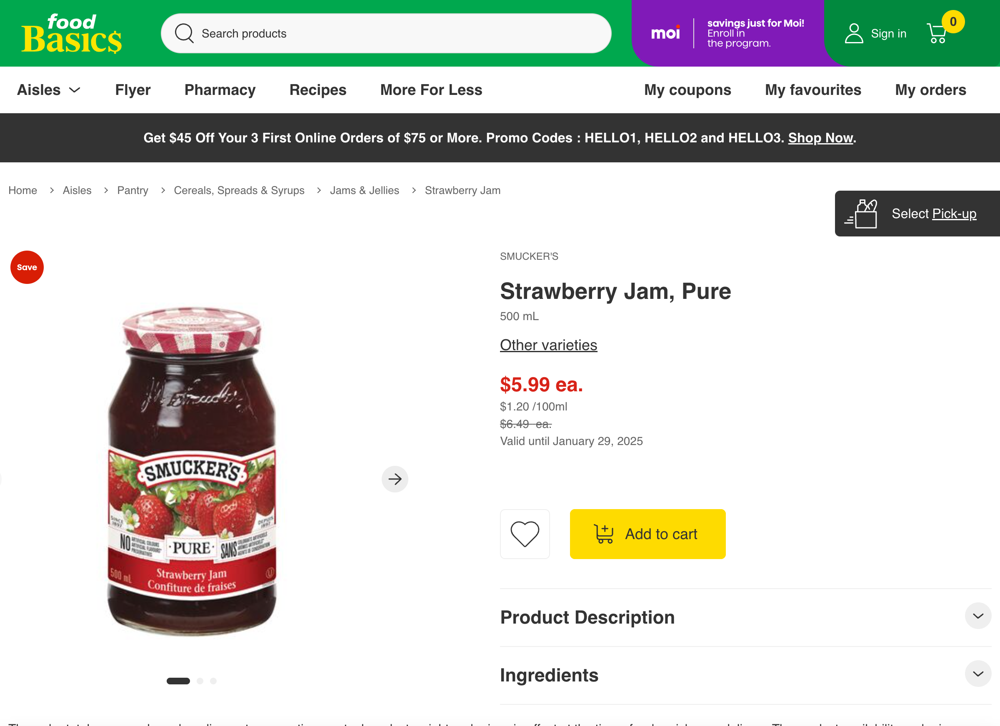

Index: 18
Initiate search for Kraft Dinner
Saved 18 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Original Flavour Macaroni and Cheese', 'quantity': 1000.0, 'unitOfMeasure': 'g', 'price': 4.99, 'pricePerWeight': 0.0049900000000000005, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/sides/pasta-sides/original-flavour-macaroni-and-cheese/p/068100905380', 'createdAt': '2025-01-27T03:32:55.241Z', 'reference_item_id': 19}
Could not find or remove the consent div: Message: 
Stacktrace:
0   chromedriver                        0x000000010291e7b8 cxxbridge1$str$ptr + 2598452
1   chromedriver                        0x0000000102916ff8 cxxbridge1$str$ptr + 2567796
2   chromedriver                        0x00000001024b7f0c cxxbridge1$string$len + 88260
3   chromedriver                        0x00000001024fd000 cxxbridge1$string$len + 371128
4   chromedriver                        0x0000000102537148 cxxbridge1$string$len + 609024
5   chromedriver                        0x0000000

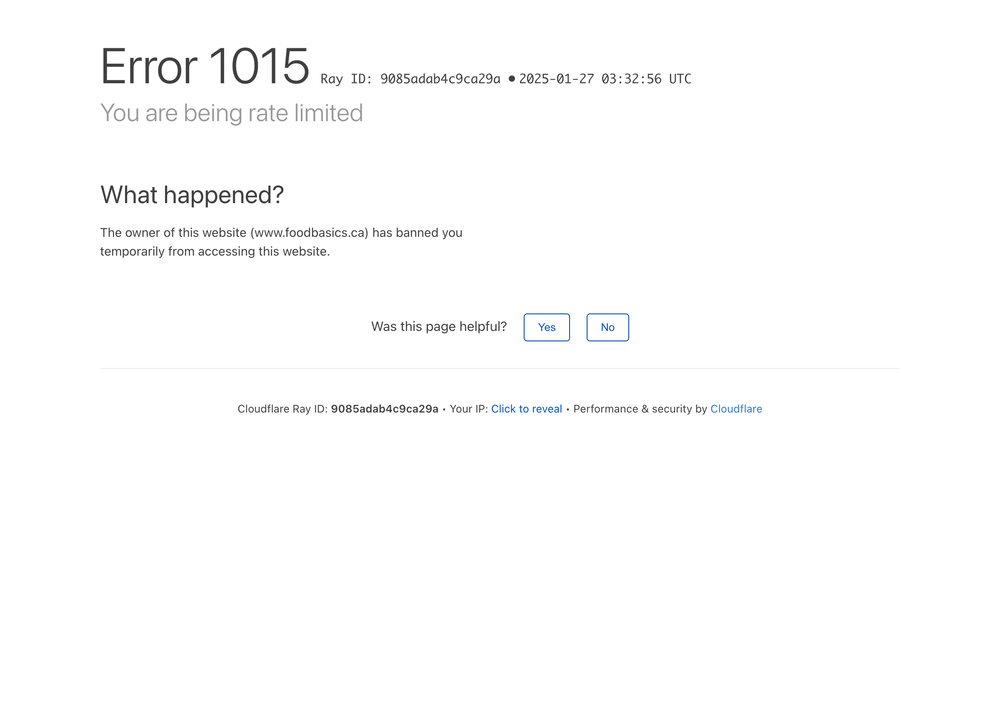

Index: 19
Initiate search for Neilson 2% Milk
Search query for Neilson 2% Milk did not return any results
Index: 20
Initiate search for Generic Product
Saved 3 item(s)
Getting cheapest of len(items) item(s):
{'name': 'General Tao Stir-fry Oriental Sauce', 'quantity': 355.0, 'unitOfMeasure': 'mL', 'price': 2.49, 'pricePerWeight': 0.007014084507042254, 'referenceUrl': 'https://www.foodbasics.ca/aisles/world-cuisine/mediterranean/general-tao-stir-fry-oriental-sauce/p/059749992497', 'createdAt': '2025-01-27T03:33:07.464Z', 'reference_item_id': 21}
Could not find or remove the consent div: Message: 
Stacktrace:
0   chromedriver                        0x0000000104e067b8 cxxbridge1$str$ptr + 2598452
1   chromedriver                        0x0000000104dfeff8 cxxbridge1$str$ptr + 2567796
2   chromedriver                        0x000000010499ff0c cxxbridge1$string$len + 88260
3   chromedriver                        0x00000001049e5000 cxxbridge1$string$len + 371128
4   chromedriver               

KeyboardInterrupt: 

In [200]:
# Run the rest
for index, row in df_mapping.iloc[16:].iterrows():
    print(f"Index: {index}")
    auto_search(product_name_query=row['product_name'], reference_item_id=row['id'])

Index: 18
Initiate search for Kraft Dinner
Saved 18 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Original Flavour Macaroni and Cheese', 'quantity': 1000.0, 'unitOfMeasure': 'g', 'price': 4.99, 'pricePerWeight': 0.0049900000000000005, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/sides/pasta-sides/original-flavour-macaroni-and-cheese/p/068100905380', 'createdAt': '2025-01-27T03:42:53.598Z', 'reference_item_id': 19}
Saved item {'name': 'Original Flavour Macaroni and Cheese', 'quantity': 1000.0, 'unitOfMeasure': 'g', 'price': 4.99, 'pricePerWeight': 0.0049900000000000005, 'referenceUrl': 'https://www.foodbasics.ca/aisles/pantry/sides/pasta-sides/original-flavour-macaroni-and-cheese/p/068100905380', 'createdAt': '2025-01-27T03:42:53.598Z', 'reference_item_id': 19, 'screenshot': './screenshots/Kraft Dinner_2025-01-26_22-42-56.png'}


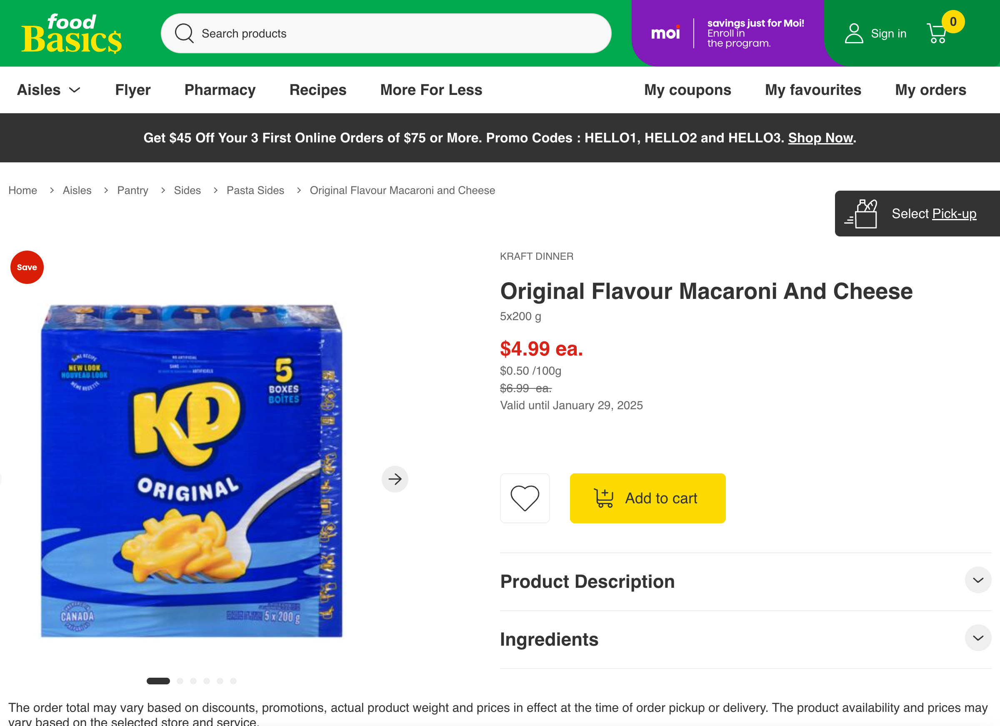

Index: 19
Initiate search for Neilson 2% Milk
Search query for Neilson 2% Milk did not return any results
Index: 20
Initiate search for Generic Product
Search query for Generic Product did not return any results


KeyboardInterrupt: 

In [205]:
import time
import random

# new ip, random headers, yay

# Run the rest
for index, row in df_mapping.iloc[18:].iterrows():
    print(f"Index: {index}")
    auto_search(product_name_query=row['product_name'], reference_item_id=row['id'])
    time.sleep(random.uniform(5, 10))

Index: 19
Initiate search for Milk
Saved 30 item(s)
Getting cheapest of len(items) item(s):
{'name': 'Coconut Milk', 'quantity': 400.0, 'unitOfMeasure': 'mL', 'price': 1.29, 'pricePerWeight': 0.003225, 'referenceUrl': 'https://www.foodbasics.ca/aisles/dairy-eggs/milk-cream-butter/lactose-free-non-dairy-milk/coconut-milk/p/624913007262', 'createdAt': '2025-01-27T03:46:51.021Z', 'reference_item_id': 20}
Saved item {'name': 'Coconut Milk', 'quantity': 400.0, 'unitOfMeasure': 'mL', 'price': 1.29, 'pricePerWeight': 0.003225, 'referenceUrl': 'https://www.foodbasics.ca/aisles/dairy-eggs/milk-cream-butter/lactose-free-non-dairy-milk/coconut-milk/p/624913007262', 'createdAt': '2025-01-27T03:46:51.021Z', 'reference_item_id': 20, 'screenshot': './screenshots/Milk_2025-01-26_22-46-53.png'}


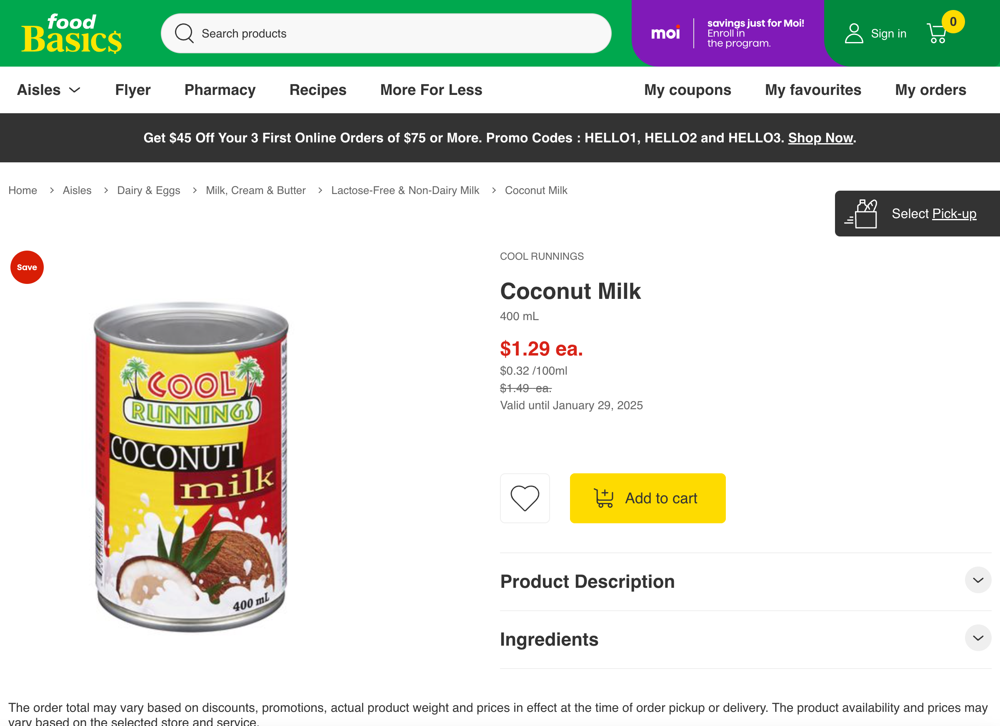

Index: 20
Initiate search for Bread loaf
Search query for Bread loaf did not return any results
Index: 21
Initiate search for Mr. Noodles Instant Noodles
Search query for Mr. Noodles Instant Noodles did not return any results


KeyboardInterrupt: 

In [207]:
import time
import random

# Run the rest
for index, row in df_mapping.iloc[19:].iterrows():
    print(f"Index: {index}")
    auto_search(product_name_query=row['product_name'], reference_item_id=row['id'])
    time.sleep(random.uniform(5, 10))